# **Indices of Industrial Production**

## **Preprocessing**

Importing required libraries,

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
from datetime import datetime, date 
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, max_error
import math

Degrading scipy to run pmdarima, displays ImportError otherwise

In [ ]:
# !pip install pmdarima scipy==1.2 -Uqq

Getting the Dataset,

In [ ]:
m_iip = pd.read_csv('https://raw.githubusercontent.com/sairam2661/datasets/main/Monthly_IIP.csv?token=GHSAT0AAAAAABME3M5GMSMQV27A6GUBTMKQYPKWEIA')

In [ ]:
m_iip.describe()

,Manufacture of food products,Manufacture of beverages,Manufacture of tobacco products,Manufacture of textiles,Manufacture of wearing apparel,Manufacture of leather and related products,"Manufacture of wood and products of wood and cork, except furniture; manufacture of articles of straw and plaiting materials",Manufacture of paper and paper products,Printing and reproduction of recorded media,Manufacture of coke and refined petroleum products,Manufacture of chemicals and chemical products,"Manufacture of pharmaceuticals, medicinal chemical and botanical products",Manufacture of rubber and plastics products,Manufacture of other non-metallic mineral products,Manufacture of basic metals,"Manufacture of fabricated metal products, except machinery and equipment","Manufacture of computer, electronic and optical products",Manufacture of electrical equipment,Manufacture of machinery and equipment n.e.c.,"Manufacture of motor vehicles, trailers and semi-trailers",Manufacture of other transport equipment,Manufacture of furniture,Other manufacturing,Mining,Manufacturing,Electricity,General
count,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.00000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000
mean,110.987826,102.660870,106.569565,113.138261,128.187826,117.170435,97.998261,102.711304,94.464348,115.875652,113.935652,170.828696,109.118261,111.651304,134.367826,98.541739,131.730435,112.780000,107.633043,101.79913,118.638261,159.942609,100.778261,100.904348,119.113913,139.780000,118.152174
std,17.715318,20.507165,24.208169,14.101347,28.283282,16.862649,15.461134,16.698071,15.725040,10.064978,9.595688,50.664221,12.162183,13.863567,22.998637,15.729216,29.525170,20.534969,18.058826,17.61462,25.078913,42.726809,24.220724,12.467842,13.429595,22.087181,12.880349
min,84.100000,7.200000,0.300000,11.000000,9.700000,1.700000,4.700000,21.700000,23.100000,87.700000,53.000000,85.200000,29.400000,16.900000,40.300000,3.700000,12.600000,5.600000,9.100000,0.70000,0.200000,1.400000,10.700000,78.800000,42.100000,94.100000,54.000000
25%,95.850000,91.300000,93.000000,111.650000,110.150000,109.950000,90.950000,94.000000,90.550000,108.300000,109.700000,119.300000,103.800000,104.150000,119.400000,92.450000,114.850000,105.350000,98.700000,97.95000,104.850000,127.300000,86.150000,91.200000,111.200000,124.450000,109.800000
50%,110.400000,98.100000,104.700000,115.900000,125.400000,119.200000,97.200000,108.300000,97.200000,115.200000,114.800000,172.600000,109.700000,111.600000,131.500000,99.100000,126.300000,112.900000,108.000000,101.70000,117.600000,162.400000,102.400000,99.100000,119.700000,142.500000,118.500000
75%,122.900000,112.700000,122.700000,119.550000,146.600000,126.850000,106.750000,114.350000,103.550000,123.950000,119.650000,222.000000,115.500000,119.250000,146.200000,108.150000,150.800000,124.750000,115.150000,109.35000,134.600000,186.050000,116.200000,108.250000,128.800000,156.450000,127.600000
max,154.400000,156.500000,167.400000,126.800000,193.600000,139.800000,132.100000,123.900000,127.500000,134.600000,131.800000,243.100000,138.100000,140.500000,184.700000,132.900000,206.200000,152.200000,160.500000,134.40000,167.200000,276.500000,161.500000,139.000000,144.600000,188.700000,145.600000


In [ ]:
m_iip.shape

(115, 28)

In [ ]:
m_iip.head()

,Date,Manufacture of food products,Manufacture of beverages,Manufacture of tobacco products,Manufacture of textiles,Manufacture of wearing apparel,Manufacture of leather and related products,"Manufacture of wood and products of wood and cork, except furniture; manufacture of articles of straw and plaiting materials",Manufacture of paper and paper products,Printing and reproduction of recorded media,Manufacture of coke and refined petroleum products,Manufacture of chemicals and chemical products,"Manufacture of pharmaceuticals, medicinal chemical and botanical products",Manufacture of rubber and plastics products,Manufacture of other non-metallic mineral products,Manufacture of basic metals,"Manufacture of fabricated metal products, except machinery and equipment","Manufacture of computer, electronic and optical products",Manufacture of electrical equipment,Manufacture of machinery and equipment n.e.c.,"Manufacture of motor vehicles, trailers and semi-trailers",Manufacture of other transport equipment,Manufacture of furniture,Other manufacturing,Mining,Manufacturing,Electricity,General
0,Apr-12,97.3,134.2,105.0,98.0,94.5,104.5,89.8,99.2,87.5,96.0,100.4,85.2,94.7,101.7,104.1,92.2,92.0,93.8,98.7,110.4,93.9,98.0,108.5,99.1,99.0,103.0,99.3
1,May-12,91.7,147.1,105.6,106.5,93.1,116.4,96.1,103.4,99.4,103.4,102.9,96.4,99.7,104.4,119.3,102.8,95.4,108.1,94.1,106.4,100.7,107.4,116.5,102.9,105.0,108.7,105.0
2,Jun-12,86.1,130.5,96.3,103.4,89.5,109.9,100.8,99.0,101.9,103.7,102.6,120.2,101.3,98.7,106.4,101.9,102.8,110.3,104.7,96.4,99.5,112.5,139.4,93.3,103.7,105.1,102.3
3,Jul-12,88.1,93.1,96.5,108.7,87.4,108.5,106.6,104.7,94.6,105.7,104.9,119.4,103.3,99.7,109.5,86.8,107.2,109.8,94.6,96.9,98.5,105.1,116.0,89.8,103.3,104.6,101.5
4,Aug-12,85.9,85.1,86.2,113.1,90.1,99.6,109.2,106.8,90.1,105.7,106.5,123.7,99.3,94.6,101.3,86.5,102.5,125.8,99.4,94.5,91.3,110.7,121.1,85.6,102.3,101.9,99.9


In [ ]:
m_iip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115 entries, 0 to 114
Data columns (total 28 columns):
 #   Column                                                                                                                        Non-Null Count  Dtype  
---  ------                                                                                                                        --------------  -----  
 0   Date                                                                                                                          115 non-null    object 
 1   Manufacture of food products                                                                                                  115 non-null    float64
 2   Manufacture of beverages                                                                                                      115 non-null    float64
 3   Manufacture of tobacco products                                                                                    

In [ ]:
m_iip.isna().sum()

Date                                                                                                                            0
Manufacture of food products                                                                                                    0
Manufacture of beverages                                                                                                        0
Manufacture of tobacco products                                                                                                 0
Manufacture of textiles                                                                                                         0
Manufacture of wearing apparel                                                                                                  0
Manufacture of leather and related products                                                                                     0
Manufacture of wood and products of wood and cork, except furniture; manufacture of articl

Changing Data from type 'Object' to type 'Date',

In [ ]:
# %b - Month in words
# %m - Month in number
# %Y - YYYY
# %y - YY

m_iip['Date'] = pd.to_datetime(m_iip['Date'],format = '%b-%y')

Storing the sector descriptions,

In [ ]:
description = list(m_iip[:0][1:])

Renaming the columns for easier handling,

In [ ]:
columns_indices = [x for x in range(0, 28)]
new_names = ['Date','Food','Beverages','Tobacco','Textiles','Wearing Apparel','Leather','Wood and Cork','Paper','Recorded Media','Petroleum','Chemicals','Pharmaceutical','Rubber','Non-Metallic','Basic metals','Fabricated Metal','Computer','Electrical','Machinery','Motor Vehicles','Other Transport','Furniture','Other Manufacturing','Mining','Manufacturing','Electricity','General']
old_names = m_iip.columns[columns_indices]
m_iip.rename(columns=dict(zip(old_names, new_names)), inplace=True)

In [ ]:
m_iip.head()

,Date,Food,Beverages,Tobacco,Textiles,Wearing Apparel,Leather,Wood and Cork,Paper,Recorded Media,Petroleum,Chemicals,Pharmaceutical,Rubber,Non-Metallic,Basic metals,Fabricated Metal,Computer,Electrical,Machinery,Motor Vehicles,Other Transport,Furniture,Other Manufacturing,Mining,Manufacturing,Electricity,General
0,2012-04-01,97.3,134.2,105.0,98.0,94.5,104.5,89.8,99.2,87.5,96.0,100.4,85.2,94.7,101.7,104.1,92.2,92.0,93.8,98.7,110.4,93.9,98.0,108.5,99.1,99.0,103.0,99.3
1,2012-05-01,91.7,147.1,105.6,106.5,93.1,116.4,96.1,103.4,99.4,103.4,102.9,96.4,99.7,104.4,119.3,102.8,95.4,108.1,94.1,106.4,100.7,107.4,116.5,102.9,105.0,108.7,105.0
2,2012-06-01,86.1,130.5,96.3,103.4,89.5,109.9,100.8,99.0,101.9,103.7,102.6,120.2,101.3,98.7,106.4,101.9,102.8,110.3,104.7,96.4,99.5,112.5,139.4,93.3,103.7,105.1,102.3
3,2012-07-01,88.1,93.1,96.5,108.7,87.4,108.5,106.6,104.7,94.6,105.7,104.9,119.4,103.3,99.7,109.5,86.8,107.2,109.8,94.6,96.9,98.5,105.1,116.0,89.8,103.3,104.6,101.5
4,2012-08-01,85.9,85.1,86.2,113.1,90.1,99.6,109.2,106.8,90.1,105.7,106.5,123.7,99.3,94.6,101.3,86.5,102.5,125.8,99.4,94.5,91.3,110.7,121.1,85.6,102.3,101.9,99.9


Replacing ' ' with '_' for easier handling,

In [ ]:
m_iip.columns = m_iip.columns.str.replace(' ','_')

In [ ]:
dm_iip = m_iip.copy()

## **Visualization**

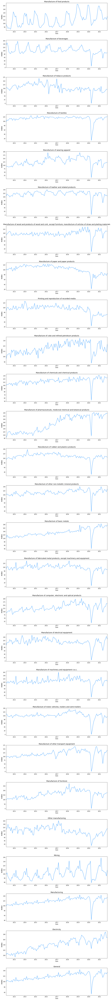

In [ ]:
f, ax = plt.subplots(nrows=27, ncols=1, figsize=(15, 150))
plt.subplots_adjust(hspace = 0.35)
index=1
for i, column in enumerate(m_iip.drop('Date', axis=1).columns):
    sns.lineplot(x=m_iip['Date'], y=m_iip[column].fillna(method='ffill'), ax=ax[i], color='dodgerblue')
    ax[i].set_title('{}'.format(description[index]), fontsize=14)
    ax[i].set_ylabel(ylabel='Index', fontsize=14)
    index = index + 1

    #From April, 2012 to October, 2021                 
    ax[i].set_xlim([date(2012, 4, 1), date(2021, 10, 1)]) 

Checking for stationarity,

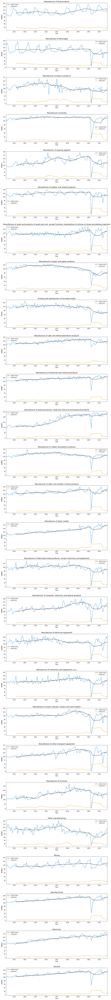

In [ ]:
rolling_window = 12
f, ax = plt.subplots(nrows=27, ncols=1, figsize=(15, 150))
plt.subplots_adjust(hspace = 0.35)

index = 1
for i, column in enumerate(m_iip.drop('Date', axis=1).columns):

    sns.lineplot(x=m_iip['Date'], y=m_iip[column], ax=ax[i], color='dodgerblue')
    sns.lineplot(x=m_iip['Date'], y=m_iip[column].rolling(rolling_window).mean(), ax=ax[i], color='black', label='rolling mean')
    sns.lineplot(x=m_iip['Date'], y=m_iip[column].rolling(rolling_window).std(), ax=ax[i], color='orange', label='rolling std')
    ax[i].set_title('{}'.format(description[index]), fontsize=14)
    ax[i].set_ylabel(ylabel='Index', fontsize=14)
    index = index + 1
    #From April, 2012 to October, 2021                 
    ax[i].set_xlim([date(2012, 4, 1), date(2021, 10, 1)]) 

plt.show()

Besides 'Manufacture of Food Products', all other features display a drop in the **mean** and **standard deviation** during 2020/21 (Possible due to the impact of COVID). <br><br>
Even, **Manufacture of Food Products** does not have a constant mean, so all the features given are non-stationary in nature.

> For further testing, need to use ADF

The data is non-stationary but we need to use stationary models such as ARIMA. So, we need to transform the data. For this we can use two methods,


1.   Transformation - log or square root to stabilize non-constant variance
2.   Differencing - subtracts the current value from the previous



Feature Engineering,

In [ ]:
# m_iip['Year'] = pd.DatetimeIndex(m_iip['Date']).year
# m_iip['Month'] = pd.DatetimeIndex(m_iip['Date']).month
# m_iip['Week_of_year'] = pd.DatetimeIndex(m_iip['Date']).weekofyear
# m_iip['Quarter'] = pd.DatetimeIndex(m_iip['Date']).quarter

# m_iip[['Year','Month','Week_of_year','Quarter']].head()

In [ ]:
dm_iip['Year'] = pd.DatetimeIndex(dm_iip['Date']).year
dm_iip['Month'] = pd.DatetimeIndex(dm_iip['Date']).month
dm_iip['Week_of_year'] = pd.DatetimeIndex(dm_iip['Date']).weekofyear
dm_iip['Quarter'] = pd.DatetimeIndex(dm_iip['Date']).quarter

dm_iip[['Year','Month','Week_of_year','Quarter']].head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  This is separate from the ipykernel package so we can avoid doing imports until


,Year,Month,Week_of_year,Quarter
0,2012,4,13,2
1,2012,5,18,2
2,2012,6,22,2
3,2012,7,26,3
4,2012,8,31,3


In [ ]:
dm_iip = dm_iip.set_index('Date')
dm_iip = dm_iip.asfreq('MS')

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

core_columns =  [
    'Food','Mining','Manufacturing','Electricity','General'
]

for column in core_columns:
    decomp = seasonal_decompose(dm_iip[column], model='additive', extrapolate_trend='freq')
    dm_iip[f"{column}_trend"] = decomp.trend
    dm_iip[f"{column}_seasonal"] = decomp.seasonal

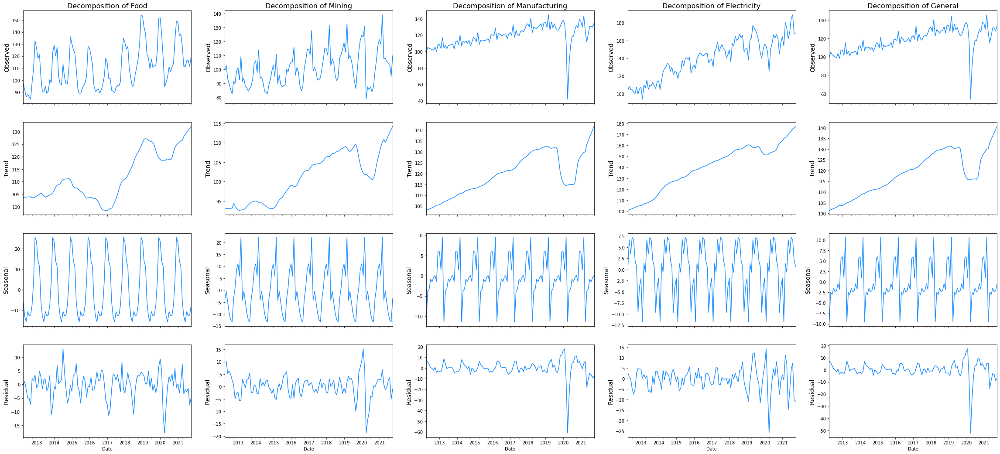

In [ ]:
fig, ax = plt.subplots(ncols=5, nrows=4, sharex=True, figsize=(40,18))

for i, column in enumerate(['Food','Mining','Manufacturing','Electricity','General']):
    
    res = seasonal_decompose(dm_iip[column], freq=12, model='additive', extrapolate_trend='freq')

    ax[0,i].set_title('Decomposition of {}'.format(column), fontsize=16)
    res.observed.plot(ax=ax[0,i], legend=False, color='dodgerblue')
    ax[0,i].set_ylabel('Observed', fontsize=14)

    res.trend.plot(ax=ax[1,i], legend=False, color='dodgerblue')
    ax[1,i].set_ylabel('Trend', fontsize=14)

    res.seasonal.plot(ax=ax[2,i], legend=False, color='dodgerblue')
    ax[2,i].set_ylabel('Seasonal', fontsize=14)
    
    res.resid.plot(ax=ax[3,i], legend=False, color='dodgerblue')
    ax[3,i].set_ylabel('Residual', fontsize=14)

plt.show()

Correlation,

In [ ]:
m_iip.corr('pearson')

,Food,Beverages,Tobacco,Textiles,Wearing_Apparel,Leather,Wood_and_Cork,Paper,Recorded_Media,Petroleum,Chemicals,Pharmaceutical,Rubber,Non-Metallic,Basic_metals,Fabricated_Metal,Computer,Electrical,Machinery,Motor_Vehicles,Other_Transport,Furniture,Other_Manufacturing,Mining,Manufacturing,Electricity,General
Food,1.000000,-0.034107,-0.037886,0.176137,0.409161,0.218056,0.357596,-0.245277,-0.053461,0.437438,0.362330,0.417537,-0.015275,0.535754,0.520983,0.157092,0.231180,0.045736,0.310990,0.193505,0.229999,0.312862,-0.221851,0.704318,0.530318,0.253688,0.562167
Beverages,-0.034107,1.000000,0.383243,0.468438,0.474324,0.707100,0.349344,0.538360,0.497878,0.205552,0.204116,-0.148742,0.508652,0.498499,0.064188,0.607033,0.224080,0.369668,0.455161,0.590758,0.318887,0.245280,0.489161,0.253052,0.311425,-0.088020,0.275551
Tobacco,-0.037886,0.383243,1.000000,0.494304,0.201816,0.497833,0.229701,0.676177,0.633396,-0.042425,0.121307,-0.470487,0.665518,0.152629,-0.138452,0.552016,-0.038405,0.567771,0.291990,0.295347,0.066874,-0.033873,0.579376,-0.034198,0.068681,-0.372663,0.000052
Textiles,0.176137,0.468438,0.494304,1.000000,0.578788,0.779047,0.711075,0.649934,0.594465,0.483027,0.639695,0.076943,0.770770,0.648840,0.397771,0.754773,0.530153,0.725169,0.727414,0.809648,0.659537,0.522836,0.561475,0.288728,0.679085,0.117580,0.606176
Wearing_Apparel,0.409161,0.474324,0.201816,0.578788,1.000000,0.736706,0.584745,0.317259,0.445808,0.694463,0.633644,0.466480,0.480835,0.717625,0.520020,0.589547,0.590657,0.354422,0.709835,0.585090,0.623342,0.772593,0.327571,0.591577,0.781282,0.412458,0.771471
Leather,0.218056,0.707100,0.497833,0.779047,0.736706,1.000000,0.646775,0.593784,0.608774,0.448736,0.590596,0.113947,0.740753,0.706517,0.354909,0.773206,0.510261,0.561979,0.691886,0.784454,0.650758,0.547858,0.531363,0.316836,0.660739,0.125359,0.596238
Wood_and_Cork,0.357596,0.349344,0.229701,0.711075,0.584745,0.646775,1.000000,0.188156,0.277645,0.454346,0.708662,0.315028,0.435957,0.694689,0.623725,0.512167,0.597258,0.555418,0.685519,0.626395,0.693838,0.548887,0.251325,0.360372,0.741515,0.291611,0.690373
Paper,-0.245277,0.538360,0.676177,0.649934,0.317259,0.593784,0.188156,1.000000,0.863315,0.086579,0.104314,-0.465979,0.764219,0.181759,-0.302156,0.753703,0.074685,0.585813,0.441451,0.556428,0.172872,0.104667,0.724175,-0.087881,0.094869,-0.393983,0.010822
Recorded_Media,-0.053461,0.497878,0.633396,0.594465,0.445808,0.608774,0.277645,0.863315,1.000000,0.176525,0.126672,-0.369678,0.665713,0.210663,-0.248169,0.775035,0.099579,0.583656,0.524495,0.548216,0.200818,0.202621,0.677908,0.071268,0.170471,-0.388027,0.095007
Petroleum,0.437438,0.205552,-0.042425,0.483027,0.694463,0.448736,0.454346,0.086579,0.176525,1.000000,0.629566,0.610981,0.223053,0.669305,0.622915,0.349458,0.621740,0.146345,0.581038,0.509553,0.603727,0.781547,0.032143,0.680674,0.793607,0.568976,0.815208


In [ ]:
# m_iip.shape

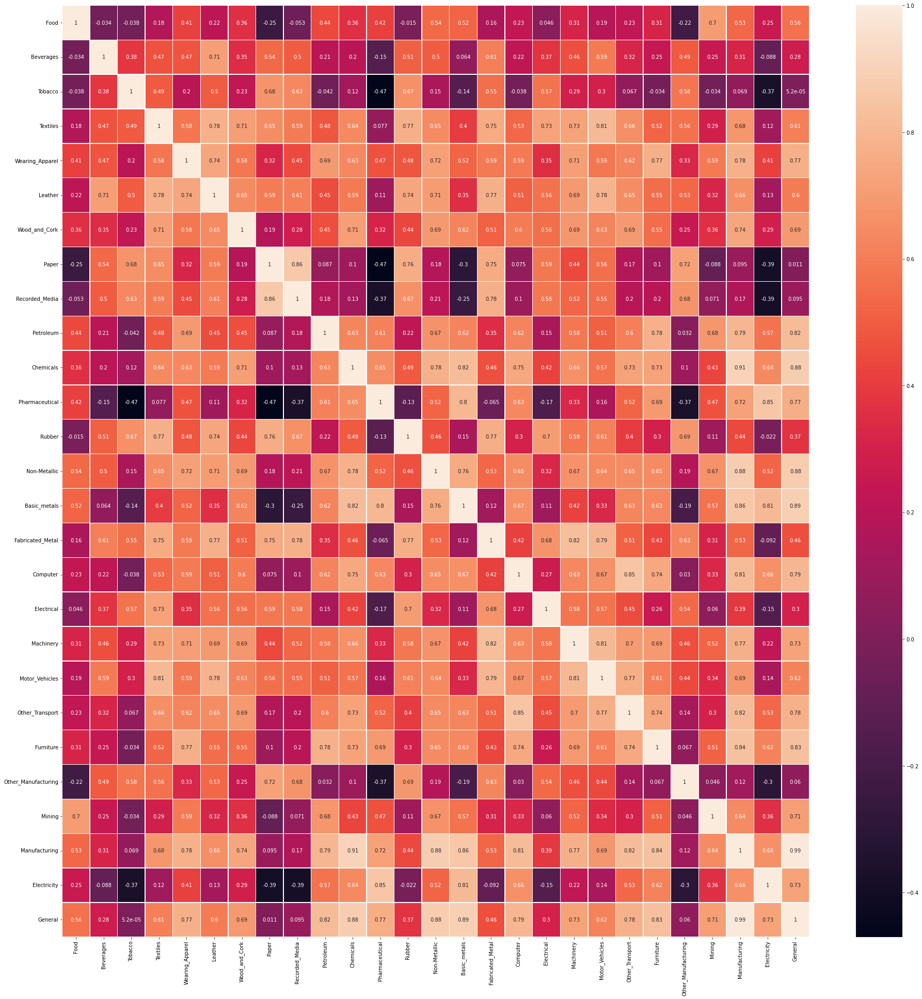

In [ ]:
plt.figure(figsize = (27,27))
ax = sns.heatmap(m_iip.corr().iloc[0:27, 0:27], annot=True, linewidths=.4)
plt.tight_layout()

In [ ]:
def get_redundant_pairs(df):
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

In [ ]:
def get_top_correlations(df, n=5):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

In [ ]:
print("Top Correlations (Excluding Major and General)")
get_top_correlations(m_iip.iloc[:,1:25], 7)

Top Correlations (Excluding Major and General)


Paper             Recorded_Media     0.863315
Computer          Other_Transport    0.850263
Fabricated_Metal  Machinery          0.822785
Chemicals         Basic_metals       0.821313
Textiles          Motor_Vehicles     0.809648
Machinery         Motor_Vehicles     0.805853
Pharmaceutical    Basic_metals       0.801030
dtype: float64

In [ ]:
print("Top Correlations")
get_top_correlations(m_iip.iloc[:,1:], 10)

Top Correlations


Manufacturing   General            0.990385
Chemicals       Manufacturing      0.905172
Basic_metals    General            0.885645
Non-Metallic    Manufacturing      0.881031
Chemicals       General            0.879921
Non-Metallic    General            0.877298
Paper           Recorded_Media     0.863315
Basic_metals    Manufacturing      0.860303
Pharmaceutical  Electricity        0.852062
Computer        Other_Transport    0.850263
dtype: float64

## **Modelling**

Autocorrelation,

In [ ]:
from pandas.plotting import autocorrelation_plot

Transformation for attaining stationarity,

In [ ]:
# ts_diff = np.diff(m_iip['Food'])
# m_iip['Food_1'] = np.append([0], ts_diff)

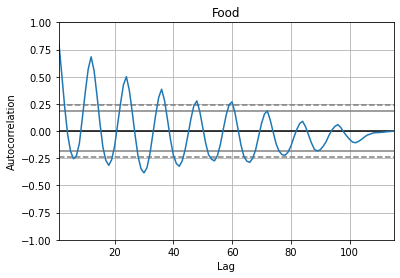

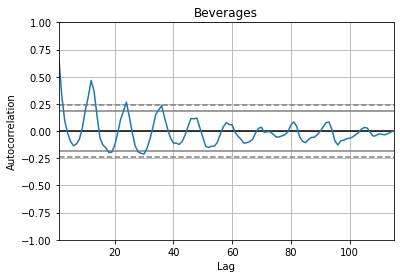

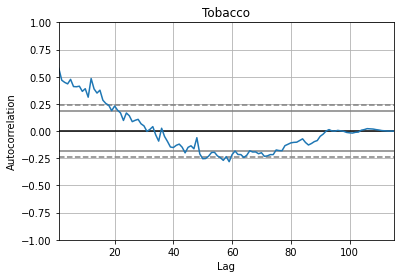

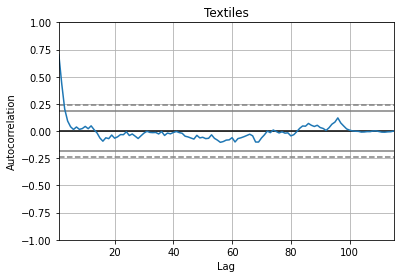

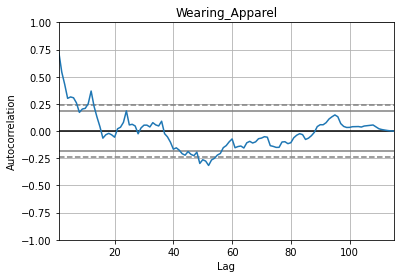

...

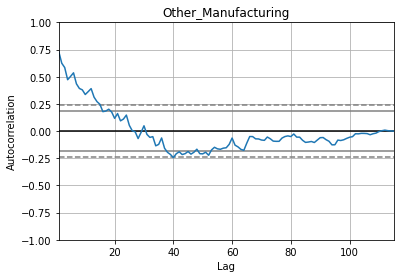

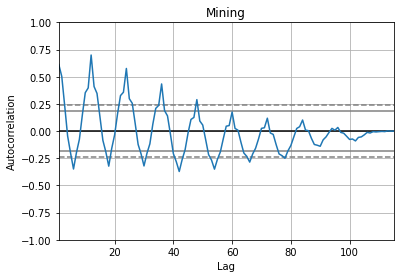

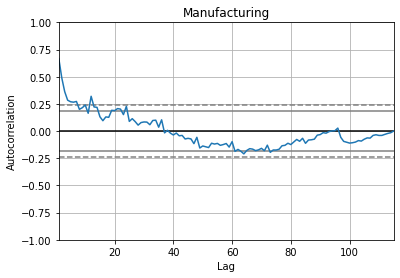

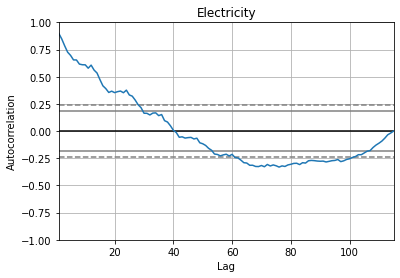

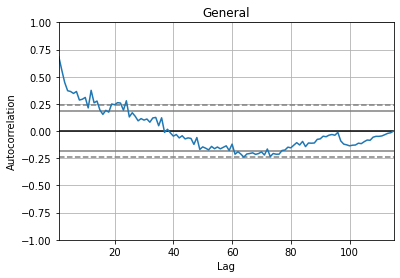

In [ ]:
for column in m_iip.drop('Date', axis=1):
    # m_iip[column] = np.log(abs(m_iip[column]))
    autocorrelation_plot(m_iip[column])
    plt.title('{}'.format(column))
    plt.show()

We try to apply **ARIMA** and **Auto-ARIMA** for **Food**,

In [ ]:
m_iip['Food'] = np.log(abs(m_iip['Food']))

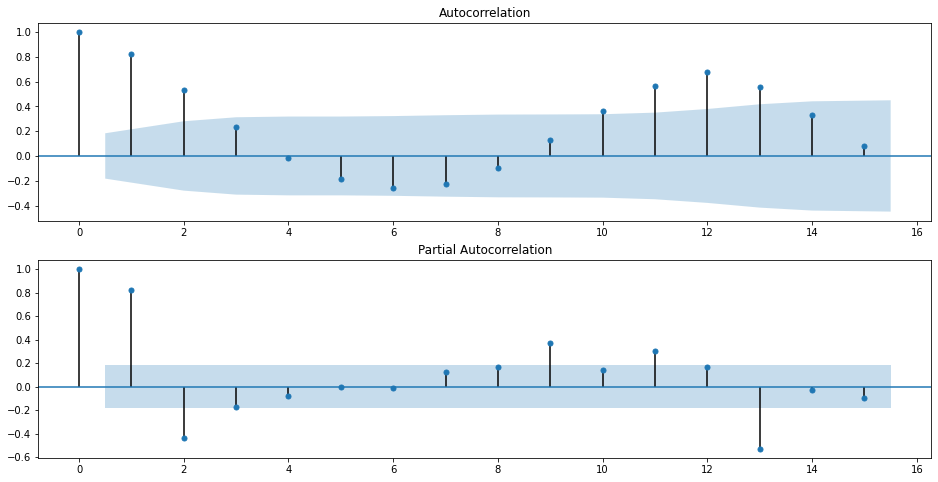

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

f, ax = plt.subplots(nrows=2, ncols=1, figsize=(16, 8))

plot_acf(m_iip['Food'], lags=15, ax=ax[0])
plot_pacf(m_iip['Food'], lags=15, ax=ax[1])

plt.show()

From the diagram above, we can see that,


*   ACF - tails off (=> MA = 0 (or) 1)
*   PACF - cuts off at **2nd** lag  (=> AR = 2)

So, for ARIMA we go for a (2,1,0) split.

(also trying a (2,1,3) split since after 3rd lag there is a big drop in ACF)

In [ ]:
train_size = int(0.85 * len(m_iip))
test_size = len(m_iip) - train_size

In [ ]:
univariate_df = m_iip[['Date', 'Food']].copy()
univariate_df.columns = ['ds', 'y']

In [ ]:
train = univariate_df.iloc[:train_size, :]

In [ ]:
train.shape

(97, 2)

In [ ]:
train.head()

,ds,y
0,2012-04-01,4.577799
1,2012-05-01,4.518522
2,2012-06-01,4.455509
3,2012-07-01,4.478473
4,2012-08-01,4.453184


In [ ]:
x_train, y_train = pd.DataFrame(univariate_df.iloc[:train_size, 0]), pd.DataFrame(univariate_df.iloc[:train_size, 1])
x_valid, y_valid = pd.DataFrame(univariate_df.iloc[train_size:, 0]), pd.DataFrame(univariate_df.iloc[train_size:, 1])

In [ ]:
x_valid.shape

(18, 1)

In [ ]:
x_valid.head()

,ds
97,2020-05-01
98,2020-06-01
99,2020-07-01
100,2020-08-01
101,2020-09-01


In [ ]:
from statsmodels.tsa.arima_model import ARIMA

# Fit model
model = ARIMA(y_train, order=(2,1,3))
model_fit = model.fit()

# Prediction with ARIMA
y_pred, se, conf = model_fit.forecast(18)

# Calcuate metrics
score_mae = mean_absolute_error(y_valid, y_pred)
score_rmse = math.sqrt(mean_squared_error(y_valid, y_pred))
score_mape = mean_absolute_percentage_error(y_valid, y_pred)

print('MAE: {}'.format(score_mae))
print('RMSE: {}'.format(score_rmse))
print('MAPE: {}'.format(score_mape))

MAE: 0.1694114364769164
RMSE: 0.18264152990651936
MAPE: 0.035400418362296605


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:492: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


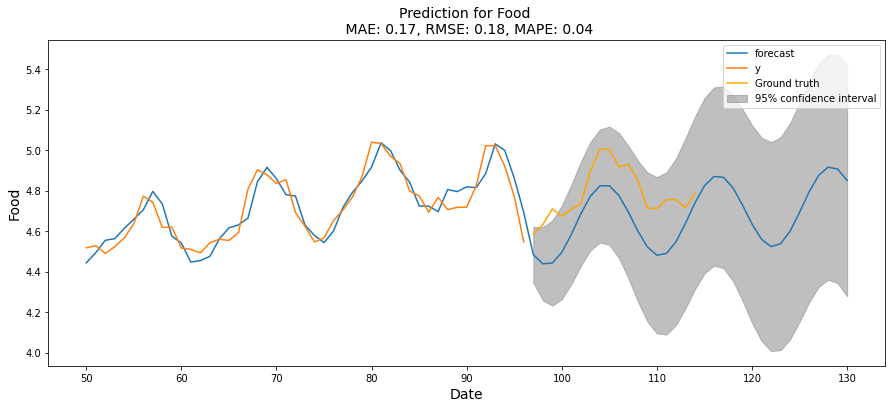

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(6)
f.set_figwidth(15)
ax.autoscale()
model_fit.plot_predict(50, 130, ax=ax)
sns.lineplot(x=x_valid.index, y=y_valid['y'], ax=ax, color='orange', label='Ground truth') 

ax.set_title(f'Prediction for Food \n MAE: {score_mae:.2f}, RMSE: {score_rmse:.2f}, MAPE: {score_mape:.2f}', fontsize=14)
ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='Food', fontsize=14)
# plt.axis([50, 140, 3, 7])
plt.show()

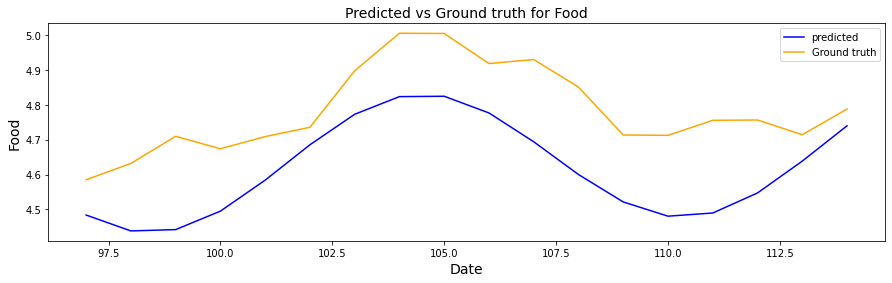

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(4)
f.set_figwidth(15)

sns.lineplot(x=x_valid.index, y=y_pred, ax=ax, color='blue', label='predicted') 
sns.lineplot(x=x_valid.index, y=y_valid['y'], ax=ax, color='orange', label='Ground truth') 

ax.set_title('Predicted vs Ground truth for Food',fontsize=14)
ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='Food', fontsize=14)

plt.show()

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm

arima = pm.auto_arima(y_train, start_p=1, start_q=1,
                      max_p=3, max_q=3, # maximum p and q
                      m=1,              # frequency of series
                      d=1,           # let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(arima.summary())

Fit ARIMA: order=(1, 1, 1); AIC=-179.026, BIC=-168.769, Fit time=0.110 seconds
Fit ARIMA: order=(0, 1, 0); AIC=-173.392, BIC=-168.264, Fit time=0.005 seconds
Fit ARIMA: order=(1, 1, 0); AIC=-180.965, BIC=-173.272, Fit time=0.040 seconds
Fit ARIMA: order=(0, 1, 1); AIC=-180.357, BIC=-172.664, Fit time=0.031 seconds
Fit ARIMA: order=(2, 1, 0); AIC=-179.070, BIC=-168.812, Fit time=0.043 seconds
Fit ARIMA: order=(2, 1, 1); AIC=-196.848, BIC=-184.027, Fit time=0.280 seconds
Fit ARIMA: order=(3, 1, 1); AIC=-199.836, BIC=-184.450, Fit time=0.369 seconds
Fit ARIMA: order=(3, 1, 0); AIC=-178.521, BIC=-165.699, Fit time=0.098 seconds
Fit ARIMA: order=(3, 1, 2); AIC=-200.289, BIC=-182.339, Fit time=0.508 seconds
Fit ARIMA: order=(2, 1, 2); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(3, 1, 3); AIC=-212.861, BIC=-192.346, Fit time=1.273 seconds
Fit ARIMA: order=(2, 1, 3); AIC=-188.274, BIC=-170.323, Fit time=0.286 seconds
Total fit time: 3.224 seconds
                             ARIMA

Auto-ARIMA suggests that (3,1,3) is the best split and not (2,1,3). <br>
Plotting it,

In [ ]:
model = ARIMA(y_train, order=(3,1,3))
model_fit = model.fit()

y_pred, se, conf = model_fit.forecast(18)

score_mae = mean_absolute_error(y_valid, y_pred)
score_rmse = math.sqrt(mean_squared_error(y_valid, y_pred))
score_mape = mean_absolute_percentage_error(y_valid, y_pred)

print('MAE: {}'.format(score_mae))
print('RMSE: {}'.format(score_rmse))
print('MAPE: {}'.format(score_mape))

MAE: 0.15784571750514084
RMSE: 0.18255528676815497
MAPE: 0.03296930399821698


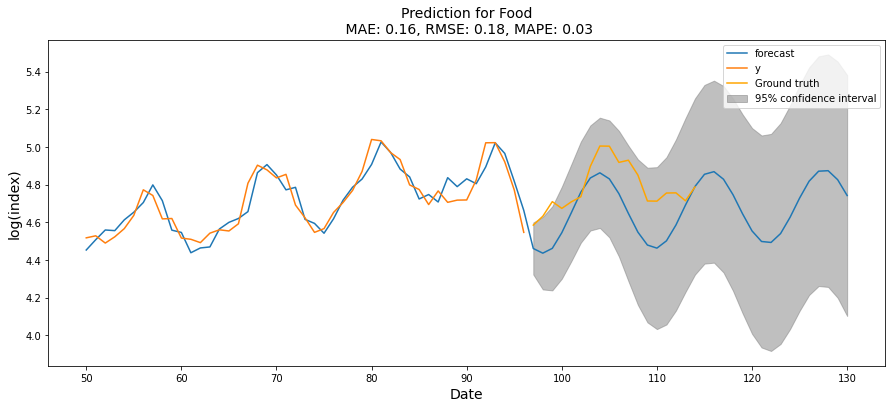

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(6)
f.set_figwidth(15)
ax.autoscale()
model_fit.plot_predict(50, 130, ax=ax)
sns.lineplot(x=x_valid.index, y=y_valid['y'], ax=ax, color='orange', label='Ground truth') 

ax.set_title(f'Prediction for Food\n MAE: {score_mae:.2f}, RMSE: {score_rmse:.2f}, MAPE: {score_mape:.2f}', fontsize=14)
ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='log(index)', fontsize=14)
# plt.axis([50, 140, 3, 7])
plt.show()

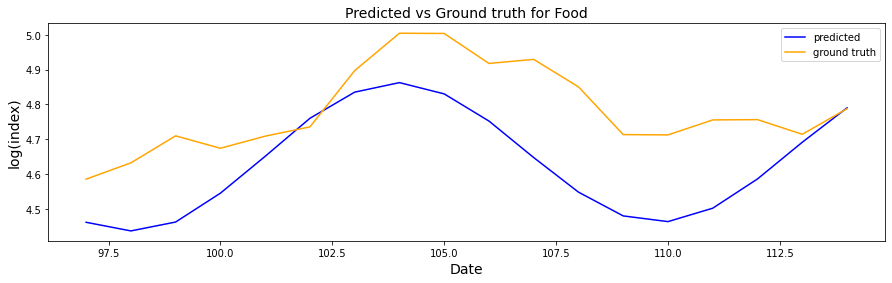

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(4)
f.set_figwidth(15)

sns.lineplot(x=x_valid.index, y=y_pred, ax=ax, color='blue', label='predicted') 
sns.lineplot(x=x_valid.index, y=y_valid['y'], ax=ax, color='orange', label='ground truth') 
ax.set_title('Predicted vs Ground truth for Food',fontsize=14)
ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='log(index)', fontsize=14)

plt.show()

# **Growth Rates of Industrial Production**

## **Preprocessing**

Importing required libraries,

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
from datetime import datetime, date 
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, max_error
import math

Getting the Dataset,

In [ ]:
m_gip = pd.read_csv('https://raw.githubusercontent.com/sairam2661/datasets/main/Monthly_GIP.csv?token=GHSAT0AAAAAABME3M5GDCCW5YHA36FJ623SYPKWIJA')

In [ ]:
m_gip.describe()

,Date,Manufacture of food products,Manufacture of beverages,Manufacture of tobacco products,Manufacture of textiles,Manufacture of wearing apparel,Manufacture of leather and related products,"Manufacture of wood and products of wood and cork, except furniture; manufacture of articles of straw and plaiting materials",Manufacture of paper and paper products,Printing and reproduction of recorded media,Manufacture of coke and refined petroleum products,Manufacture of chemicals and chemical products,"Manufacture of pharmaceuticals, medicinal chemical and botanical products",Manufacture of rubber and plastics products,Manufacture of other non-metallic mineral products,Manufacture of basic metals,"Manufacture of fabricated metal products, except machinery and equipment","Manufacture of computer, electronic and optical products",Manufacture of electrical equipment,Manufacture of machinery and equipment n.e.c.,"Manufacture of motor vehicles, trailers and semi-trailers",Manufacture of other transport equipment,Manufacture of furniture,Other manufacturing,Mining,Manufacturing,Electricity,General
count,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115,115
unique,115,103,98,108,91,108,96,102,98,94,84,80,98,103,102,93,107,103,105,99,102,100,110,103,94,82,85,82
top,Feb-20,-3.7,3.2,9.4,3.1,1.4,-3.6,5.4,-5.0,2.2,6.6,-0.9,6.4,-0.7,0.8,4.3,3.3,2.7,-5.0,-6.4,-3.5,-3.5,6.8,-32.4,5.7,4.8,5.1,1.0
freq,1,4,3,2,3,2,3,3,4,4,4,4,4,3,3,4,2,3,2,4,3,2,2,3,3,4,5,4


In [ ]:
m_gip.shape

(115, 28)

In [ ]:
m_gip.head()

,Date,Manufacture of food products,Manufacture of beverages,Manufacture of tobacco products,Manufacture of textiles,Manufacture of wearing apparel,Manufacture of leather and related products,"Manufacture of wood and products of wood and cork, except furniture; manufacture of articles of straw and plaiting materials",Manufacture of paper and paper products,Printing and reproduction of recorded media,Manufacture of coke and refined petroleum products,Manufacture of chemicals and chemical products,"Manufacture of pharmaceuticals, medicinal chemical and botanical products",Manufacture of rubber and plastics products,Manufacture of other non-metallic mineral products,Manufacture of basic metals,"Manufacture of fabricated metal products, except machinery and equipment","Manufacture of computer, electronic and optical products",Manufacture of electrical equipment,Manufacture of machinery and equipment n.e.c.,"Manufacture of motor vehicles, trailers and semi-trailers",Manufacture of other transport equipment,Manufacture of furniture,Other manufacturing,Mining,Manufacturing,Electricity,General
0,Apr-12,-2.7,34.2,5.0,-2.0,-5.5,4.5,-10.2,-0.8,-12.5,-4.0,0.4,-14.8,-5.3,1.7,4.1,-7.8,-8.0,-6.2,-1.3,10.4,-6.1,-2.0,8.5,-0.9,-1.0,3.0,-0.7
1,May-12,-8.3,47.1,5.6,6.5,-6.9,16.4,-3.9,3.4,-0.6,3.4,2.9,-3.6,-0.3,4.4,19.3,2.8,-4.6,8.1,-5.9,6.4,0.7,7.4,16.5,2.9,5.0,8.7,5.0
2,Jun-12,-13.9,30.5,-3.7,3.4,-10.5,9.9,0.8,-1.0,1.9,3.7,2.6,20.2,1.3,-1.3,6.4,1.9,2.8,10.3,4.7,-3.6,-0.5,12.5,39.4,-6.7,3.7,5.1,2.3
3,Jul-12,-11.9,-6.9,-3.5,8.7,-12.6,8.5,6.6,4.7,-5.4,5.7,4.9,19.4,3.3,-0.3,9.5,-13.2,7.2,9.8,-5.4,-3.1,-1.5,5.1,16.0,-10.2,3.3,4.6,1.5
4,Aug-12,-14.1,-14.9,-13.8,13.1,-9.9,-0.4,9.2,6.8,-9.9,5.7,6.5,23.7,-0.7,-5.4,1.3,-13.5,2.5,25.8,-0.6,-5.5,-8.7,10.7,21.1,-14.4,2.3,1.9,-0.1


In [ ]:
m_gip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115 entries, 0 to 114
Data columns (total 28 columns):
 #   Column                                                                                                                        Non-Null Count  Dtype 
---  ------                                                                                                                        --------------  ----- 
 0   Date                                                                                                                          115 non-null    object
 1   Manufacture of food products                                                                                                  115 non-null    object
 2   Manufacture of beverages                                                                                                      115 non-null    object
 3   Manufacture of tobacco products                                                                                         

In [ ]:
m_gip.isna().sum()

Date                                                                                                                            0
Manufacture of food products                                                                                                    0
Manufacture of beverages                                                                                                        0
Manufacture of tobacco products                                                                                                 0
Manufacture of textiles                                                                                                         0
Manufacture of wearing apparel                                                                                                  0
Manufacture of leather and related products                                                                                     0
Manufacture of wood and products of wood and cork, except furniture; manufacture of articl

Changing Data from type 'Object' to type 'Date',

In [ ]:
# %b - Month in words
# %m - Month in number
# %Y - YYYY
# %y - YY

m_gip['Date'] = pd.to_datetime(m_iip['Date'],format = '%b-%y')

In [ ]:
handle = m_iip.copy()

In [ ]:
handle.set_index('Date', inplace=True)

In [ ]:
handle.index = pd.to_datetime(handle.index)

In [ ]:
handle.loc['GR'] = 100 * (handle.iloc[108] - handle.iloc[107])/handle.iloc[107]

In [ ]:
handle.loc['GR']

Food                   -1.601783
Beverages             -17.344173
Tobacco               -38.596491
Textiles               -4.180602
Wearing_Apparel       -42.002782
Leather               -17.909238
Wood_and_Cork         -17.940467
Paper                  -1.783724
Recorded_Media        -14.643799
Petroleum              -9.472880
Chemicals              -7.662236
Pharmaceutical        -12.310360
Rubber                 -7.229965
Non-Metallic           -8.695652
Basic_metals           -8.770980
Fabricated_Metal      -23.333333
Computer              -42.192047
Electrical            -23.251589
Machinery             -27.662835
Motor_Vehicles        -11.053090
Other_Transport       -25.189264
Furniture             -25.277291
Other_Manufacturing     1.497326
Mining                -22.589928
Manufacturing         -13.049546
Electricity            -3.333333
General               -13.392857
Name: GR, dtype: float64

In [ ]:
m_gip.loc[[108],1:] = handle.loc['GR'].values

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  """Entry point for launching an IPython kernel.


In [ ]:
m_gip.head(110)

,Date,Manufacture of food products,Manufacture of beverages,Manufacture of tobacco products,Manufacture of textiles,Manufacture of wearing apparel,Manufacture of leather and related products,"Manufacture of wood and products of wood and cork, except furniture; manufacture of articles of straw and plaiting materials",Manufacture of paper and paper products,Printing and reproduction of recorded media,Manufacture of coke and refined petroleum products,Manufacture of chemicals and chemical products,"Manufacture of pharmaceuticals, medicinal chemical and botanical products",Manufacture of rubber and plastics products,Manufacture of other non-metallic mineral products,Manufacture of basic metals,"Manufacture of fabricated metal products, except machinery and equipment","Manufacture of computer, electronic and optical products",Manufacture of electrical equipment,Manufacture of machinery and equipment n.e.c.,"Manufacture of motor vehicles, trailers and semi-trailers",Manufacture of other transport equipment,Manufacture of furniture,Other manufacturing,Mining,Manufacturing,Electricity,General
0,2012-04-01,-2.7,34.2,5.0,-2.0,-5.5,4.5,-10.2,-0.8,-12.5,-4.0,0.4,-14.8,-5.3,1.7,4.1,-7.8,-8.0,-6.2,-1.3,10.4,-6.1,-2.0,8.5,-0.9,-1.0,3.0,-0.7
1,2012-05-01,-8.3,47.1,5.6,6.5,-6.9,16.4,-3.9,3.4,-0.6,3.4,2.9,-3.6,-0.3,4.4,19.3,2.8,-4.6,8.1,-5.9,6.4,0.7,7.4,16.5,2.9,5.0,8.7,5.0
2,2012-06-01,-13.9,30.5,-3.7,3.4,-10.5,9.9,0.8,-1.0,1.9,3.7,2.6,20.2,1.3,-1.3,6.4,1.9,2.8,10.3,4.7,-3.6,-0.5,12.5,39.4,-6.7,3.7,5.1,2.3
3,2012-07-01,-11.9,-6.9,-3.5,8.7,-12.6,8.5,6.6,4.7,-5.4,5.7,4.9,19.4,3.3,-0.3,9.5,-13.2,7.2,9.8,-5.4,-3.1,-1.5,5.1,16.0,-10.2,3.3,4.6,1.5
4,2012-08-01,-14.1,-14.9,-13.8,13.1,-9.9,-0.4,9.2,6.8,-9.9,5.7,6.5,23.7,-0.7,-5.4,1.3,-13.5,2.5,25.8,-0.6,-5.5,-8.7,10.7,21.1,-14.4,2.3,1.9,-0.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,2021-01-01,-1.8,-7.6,-4.3,-5.6,-20.3,-4.4,7.5,-12.6,-25.4,-0.5,5.4,-8.8,6.0,-6.1,6.6,-1.0,-1.7,-2.9,-7.2,-0.6,6.0,-19.3,-3.3,-2.4,-0.9,5.5,-0.6
106,2021-02-01,-0.3,-12.9,-7.8,-2.7,-14.9,-7.5,-6.4,-10.9,-28.5,-9.4,-2.2,-5.0,2.3,-6.8,-3.5,-2.3,20.9,3.4,-1.6,5.6,2.7,-19.4,4.1,-4.4,-3.4,0.1,-3.2
107,2021-03-01,17.1,26.5,24.6,19.2,24.4,22.4,46.1,29.6,2.2,-1.1,26.5,36.8,47.4,30.9,29.2,39.5,105.0,54.2,50.2,79.0,34.8,1.4,50.8,6.1,28.4,22.5,24.2
108,2021-04-01,-1.60178,-17.3442,-38.5965,-4.1806,-42.0028,-17.9092,-17.9405,-1.78372,-14.6438,-9.47288,-7.66224,-12.3104,-7.22997,-8.69565,-8.77098,-23.3333,-42.192,-23.2516,-27.6628,-11.0531,-25.1893,-25.2773,1.49733,-22.5899,-13.0495,-3.33333,-13.3929


Storing the sector descriptions,

In [ ]:
description = list(m_gip[:0][1:])

Converting object to float,

In [ ]:
for column in list(m_gip.iloc[:0,1:]):
  m_gip[column] = pd.to_numeric(m_gip[column], errors = 'coerce')

Renaming the columns for easier handling,

In [ ]:
columns_indices = [x for x in range(0, 28)]
new_names = ['Date','Food','Beverages','Tobacco','Textiles','Wearing Apparel','Leather','Wood and Cork','Paper','Recorded Media','Petroleum','Chemicals','Pharmaceutical','Rubber','Non-Metallic','Basic metals','Fabricated Metal','Computer','Electrical','Machinery','Motor Vehicles','Other Transport','Furniture','Other Manufacturing','Mining','Manufacturing','Electricity','General']
old_names = m_gip.columns[columns_indices]
m_gip.rename(columns=dict(zip(old_names, new_names)), inplace=True)

In [ ]:
m_gip.head(109)

,Date,Food,Beverages,Tobacco,Textiles,Wearing Apparel,Leather,Wood and Cork,Paper,Recorded Media,Petroleum,Chemicals,Pharmaceutical,Rubber,Non-Metallic,Basic metals,Fabricated Metal,Computer,Electrical,Machinery,Motor Vehicles,Other Transport,Furniture,Other Manufacturing,Mining,Manufacturing,Electricity,General
0,2012-04-01,-2.700000,34.200000,5.000000,-2.000000,-5.500000,4.500000,-10.200000,-0.800000,-12.500000,-4.00000,0.400000,-14.80000,-5.300000,1.700000,4.10000,-7.800000,-8.000000,-6.200000,-1.300000,10.40000,-6.100000,-2.000000,8.500000,-0.900000,-1.000000,3.000000,-0.700000
1,2012-05-01,-8.300000,47.100000,5.600000,6.500000,-6.900000,16.400000,-3.900000,3.400000,-0.600000,3.40000,2.900000,-3.60000,-0.300000,4.400000,19.30000,2.800000,-4.600000,8.100000,-5.900000,6.40000,0.700000,7.400000,16.500000,2.900000,5.000000,8.700000,5.000000
2,2012-06-01,-13.900000,30.500000,-3.700000,3.400000,-10.500000,9.900000,0.800000,-1.000000,1.900000,3.70000,2.600000,20.20000,1.300000,-1.300000,6.40000,1.900000,2.800000,10.300000,4.700000,-3.60000,-0.500000,12.500000,39.400000,-6.700000,3.700000,5.100000,2.300000
3,2012-07-01,-11.900000,-6.900000,-3.500000,8.700000,-12.600000,8.500000,6.600000,4.700000,-5.400000,5.70000,4.900000,19.40000,3.300000,-0.300000,9.50000,-13.200000,7.200000,9.800000,-5.400000,-3.10000,-1.500000,5.100000,16.000000,-10.200000,3.300000,4.600000,1.500000
4,2012-08-01,-14.100000,-14.900000,-13.800000,13.100000,-9.900000,-0.400000,9.200000,6.800000,-9.900000,5.70000,6.500000,23.70000,-0.700000,-5.400000,1.30000,-13.500000,2.500000,25.800000,-0.600000,-5.50000,-8.700000,10.700000,21.100000,-14.400000,2.300000,1.900000,-0.100000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104,2020-12-01,-1.700000,-7.700000,-2.100000,-7.000000,-18.000000,-5.600000,-4.200000,-17.000000,-19.900000,-0.70000,7.200000,6.70000,8.900000,-4.800000,6.30000,3.300000,21.400000,9.600000,9.600000,6.80000,-8.000000,-10.100000,-3.200000,-3.000000,2.700000,5.100000,2.200000
105,2021-01-01,-1.800000,-7.600000,-4.300000,-5.600000,-20.300000,-4.400000,7.500000,-12.600000,-25.400000,-0.50000,5.400000,-8.80000,6.000000,-6.100000,6.60000,-1.000000,-1.700000,-2.900000,-7.200000,-0.60000,6.000000,-19.300000,-3.300000,-2.400000,-0.900000,5.500000,-0.600000
106,2021-02-01,-0.300000,-12.900000,-7.800000,-2.700000,-14.900000,-7.500000,-6.400000,-10.900000,-28.500000,-9.40000,-2.200000,-5.00000,2.300000,-6.800000,-3.50000,-2.300000,20.900000,3.400000,-1.600000,5.60000,2.700000,-19.400000,4.100000,-4.400000,-3.400000,0.100000,-3.200000
107,2021-03-01,17.100000,26.500000,24.600000,19.200000,24.400000,22.400000,46.100000,29.600000,2.200000,-1.10000,26.500000,36.80000,47.400000,30.900000,29.20000,39.500000,105.000000,54.200000,50.200000,79.00000,34.800000,1.400000,50.800000,6.100000,28.400000,22.500000,24.200000


Replacing ' ' with '_' for easier handling,

In [ ]:
m_gip.columns = m_gip.columns.str.replace(' ','_')

In [ ]:
dm_gip = m_gip.copy()

In [ ]:
m_gip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115 entries, 0 to 114
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Date                 115 non-null    datetime64[ns]
 1   Food                 115 non-null    float64       
 2   Beverages            115 non-null    float64       
 3   Tobacco              115 non-null    float64       
 4   Textiles             115 non-null    float64       
 5   Wearing_Apparel      115 non-null    float64       
 6   Leather              115 non-null    float64       
 7   Wood_and_Cork        115 non-null    float64       
 8   Paper                115 non-null    float64       
 9   Recorded_Media       115 non-null    float64       
 10  Petroleum            115 non-null    float64       
 11  Chemicals            115 non-null    float64       
 12  Pharmaceutical       115 non-null    float64       
 13  Rubber               115 non-null  

In [ ]:
m_gip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115 entries, 0 to 114
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Date                 115 non-null    datetime64[ns]
 1   Food                 115 non-null    float64       
 2   Beverages            115 non-null    float64       
 3   Tobacco              115 non-null    float64       
 4   Textiles             115 non-null    float64       
 5   Wearing_Apparel      115 non-null    float64       
 6   Leather              115 non-null    float64       
 7   Wood_and_Cork        115 non-null    float64       
 8   Paper                115 non-null    float64       
 9   Recorded_Media       115 non-null    float64       
 10  Petroleum            115 non-null    float64       
 11  Chemicals            115 non-null    float64       
 12  Pharmaceutical       115 non-null    float64       
 13  Rubber               115 non-null  

## **Visualization**

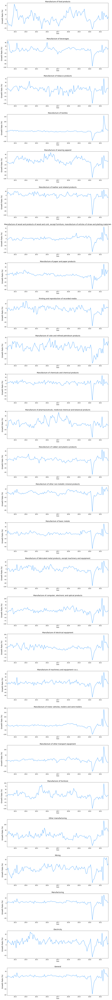

In [ ]:
f, ax = plt.subplots(nrows=27, ncols=1, figsize=(15, 150))
plt.subplots_adjust(hspace = 0.35)
index=1
for i, column in enumerate(m_gip.drop('Date', axis=1).columns):
    sns.lineplot(x=m_gip['Date'], y=m_gip[column].fillna(method='ffill'), ax=ax[i], color='dodgerblue')
    ax[i].set_title('{}'.format(description[index]), fontsize=14)
    ax[i].set_ylabel(ylabel='Growth Rate (%)', fontsize=14)
    index = index + 1

    #From April, 2012 to October, 2021                 
    ax[i].set_xlim([date(2012, 4, 1), date(2021, 10, 1)]) 

Checking for stationarity,

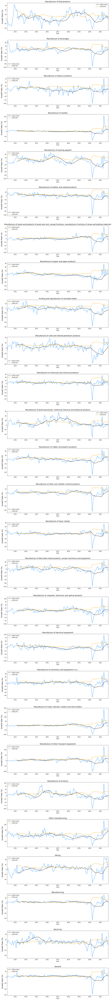

In [ ]:
rolling_window = 12
f, ax = plt.subplots(nrows=27, ncols=1, figsize=(15, 150))
plt.subplots_adjust(hspace = 0.35)

index = 1
for i, column in enumerate(m_gip.drop('Date', axis=1).columns):

    sns.lineplot(x=m_gip['Date'], y=m_gip[column], ax=ax[i], color='dodgerblue')
    sns.lineplot(x=m_gip['Date'], y=m_gip[column].rolling(rolling_window).mean(), ax=ax[i], color='black', label='rolling mean')
    sns.lineplot(x=m_gip['Date'], y=m_gip[column].rolling(rolling_window).std(), ax=ax[i], color='orange', label='rolling std')
    ax[i].set_title('{}'.format(description[index]), fontsize=14)
    ax[i].set_ylabel(ylabel='Growth Rate (%)', fontsize=14)
    index = index + 1
    #From April, 2012 to October, 2021                 
    ax[i].set_xlim([date(2012, 4, 1), date(2021, 10, 1)]) 

plt.show()

> For further testing, need to use ADF

The data is non-stationary but we need to use stationary models such as ARIMA. So, we need to transform the data. For this we can use two methods,


1.   Transformation - log or square root to stabilize non-constant variance
2.   Differencing - subtracts the current value from the previous



Feature Engineering,

In [ ]:
# m_gip['Year'] = pd.DatetimeIndex(m_gip['Date']).year
# m_gip['Month'] = pd.DatetimeIndex(m_gip['Date']).month
# m_gip['Week_of_year'] = pd.DatetimeIndex(m_gip['Date']).weekofyear
# m_gip['Quarter'] = pd.DatetimeIndex(m_gip['Date']).quarter

# m_gip[['Year','Month','Week_of_year','Quarter']].head()

In [ ]:
dm_gip['Year'] = pd.DatetimeIndex(dm_gip['Date']).year
dm_gip['Month'] = pd.DatetimeIndex(dm_gip['Date']).month
dm_gip['Week_of_year'] = pd.DatetimeIndex(dm_gip['Date']).weekofyear
dm_gip['Quarter'] = pd.DatetimeIndex(dm_gip['Date']).quarter

dm_gip[['Year','Month','Week_of_year','Quarter']].head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  This is separate from the ipykernel package so we can avoid doing imports until


,Year,Month,Week_of_year,Quarter
0,2012,4,13,2
1,2012,5,18,2
2,2012,6,22,2
3,2012,7,26,3
4,2012,8,31,3


In [ ]:
dm_gip = dm_gip.set_index('Date')
dm_gip = dm_gip.asfreq('MS')

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

core_columns =  [
    'Food','Mining','Manufacturing','Electricity','General'
]

for column in core_columns:
    decomp = seasonal_decompose(dm_gip[column], model='additive', extrapolate_trend='freq')
    dm_gip[f"{column}_trend"] = decomp.trend
    dm_gip[f"{column}_seasonal"] = decomp.seasonal

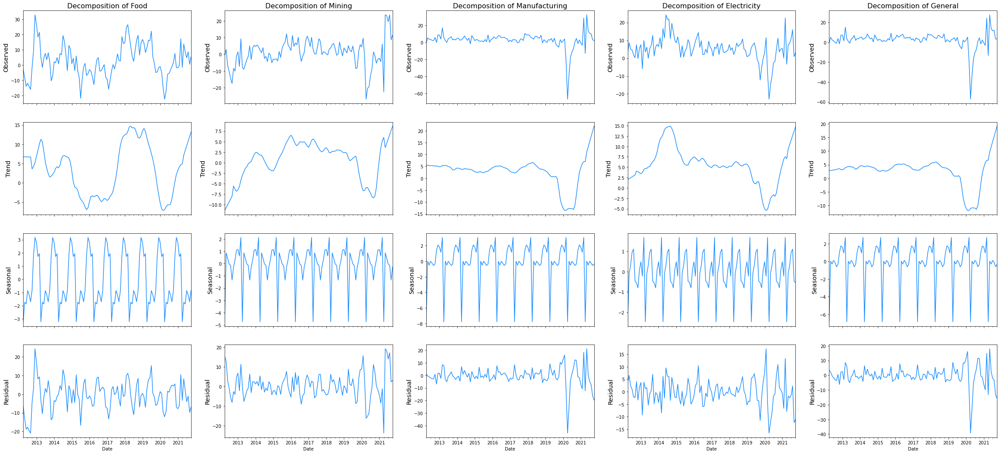

In [ ]:
fig, ax = plt.subplots(ncols=5, nrows=4, sharex=True, figsize=(40,18))

for i, column in enumerate(['Food','Mining','Manufacturing','Electricity','General']):
    
    res = seasonal_decompose(dm_gip[column], freq=12, model='additive', extrapolate_trend='freq')

    ax[0,i].set_title('Decomposition of {}'.format(column), fontsize=16)
    res.observed.plot(ax=ax[0,i], legend=False, color='dodgerblue')
    ax[0,i].set_ylabel('Observed', fontsize=14)

    res.trend.plot(ax=ax[1,i], legend=False, color='dodgerblue')
    ax[1,i].set_ylabel('Trend', fontsize=14)

    res.seasonal.plot(ax=ax[2,i], legend=False, color='dodgerblue')
    ax[2,i].set_ylabel('Seasonal', fontsize=14)
    
    res.resid.plot(ax=ax[3,i], legend=False, color='dodgerblue')
    ax[3,i].set_ylabel('Residual', fontsize=14)

plt.show()

Correlation,

In [ ]:
m_gip.corr('pearson')

,Food,Beverages,Tobacco,Textiles,Wearing_Apparel,Leather,Wood_and_Cork,Paper,Recorded_Media,Petroleum,Chemicals,Pharmaceutical,Rubber,Non-Metallic,Basic_metals,Fabricated_Metal,Computer,Electrical,Machinery,Motor_Vehicles,Other_Transport,Furniture,Other_Manufacturing,Mining,Manufacturing,Electricity,General
Food,1.000000,0.372976,0.330521,0.305275,0.299326,0.435020,0.399145,0.225647,0.252614,0.218146,0.301589,-0.046612,0.225377,0.562939,0.429399,0.392537,0.350625,0.285059,0.375440,0.379067,0.419537,0.096843,0.065129,0.246615,0.475053,0.336262,0.468129
Beverages,0.372976,1.000000,0.330035,0.442449,0.578251,0.722448,0.577917,0.578720,0.534718,0.540919,0.610277,0.221308,0.465086,0.767283,0.611403,0.664555,0.524486,0.554864,0.612844,0.475674,0.535804,0.419740,0.391030,0.467970,0.741389,0.588919,0.744686
Tobacco,0.330521,0.330035,1.000000,0.511111,0.441720,0.565634,0.468248,0.528517,0.484385,0.293668,0.484214,-0.110871,0.571468,0.471866,0.608696,0.414042,0.359680,0.487843,0.420132,0.386162,0.442726,0.363998,0.443058,0.268729,0.538626,0.384006,0.526264
Textiles,0.305275,0.442449,0.511111,1.000000,0.471670,0.633704,0.788886,0.718226,0.515719,0.537939,0.547408,0.076305,0.633376,0.613660,0.746848,0.634820,0.514395,0.784273,0.742403,0.880541,0.824248,0.558212,0.699879,0.577731,0.763203,0.414777,0.755960
Wearing_Apparel,0.299326,0.578251,0.441720,0.471670,1.000000,0.626228,0.611895,0.613953,0.682546,0.520604,0.616101,0.350081,0.566347,0.608870,0.520075,0.561537,0.496712,0.526319,0.592203,0.400581,0.532223,0.523640,0.468459,0.514842,0.693756,0.448342,0.700201
Leather,0.435020,0.722448,0.565634,0.633704,0.626228,1.000000,0.687806,0.664710,0.604812,0.570955,0.782608,0.329376,0.717390,0.794949,0.767076,0.711213,0.624466,0.690231,0.720097,0.627028,0.720255,0.540750,0.492873,0.376613,0.884548,0.605927,0.858452
Wood_and_Cork,0.399145,0.577917,0.468248,0.788886,0.611895,0.687806,1.000000,0.606447,0.575128,0.495045,0.643783,0.152823,0.634177,0.746703,0.775292,0.639140,0.633585,0.755903,0.740435,0.759278,0.783191,0.491671,0.627740,0.624820,0.814810,0.519253,0.818094
Paper,0.225647,0.578720,0.528517,0.718226,0.613953,0.664710,0.606447,1.000000,0.671179,0.575665,0.664989,0.242020,0.693630,0.711667,0.602642,0.704927,0.632025,0.674414,0.711674,0.654069,0.640902,0.552531,0.617032,0.478123,0.769550,0.527756,0.759531
Recorded_Media,0.252614,0.534718,0.484385,0.515719,0.682546,0.604812,0.575128,0.671179,1.000000,0.530016,0.582165,0.260762,0.581547,0.586635,0.558631,0.613016,0.516133,0.531519,0.613117,0.445676,0.530847,0.519454,0.503129,0.561750,0.698121,0.492594,0.710960
Petroleum,0.218146,0.540919,0.293668,0.537939,0.520604,0.570955,0.495045,0.575665,0.530016,1.000000,0.432453,0.200781,0.409466,0.600438,0.487744,0.461152,0.399426,0.455380,0.534201,0.453353,0.481047,0.576597,0.456824,0.520781,0.653089,0.403584,0.657891


In [ ]:
#m_gip.shape

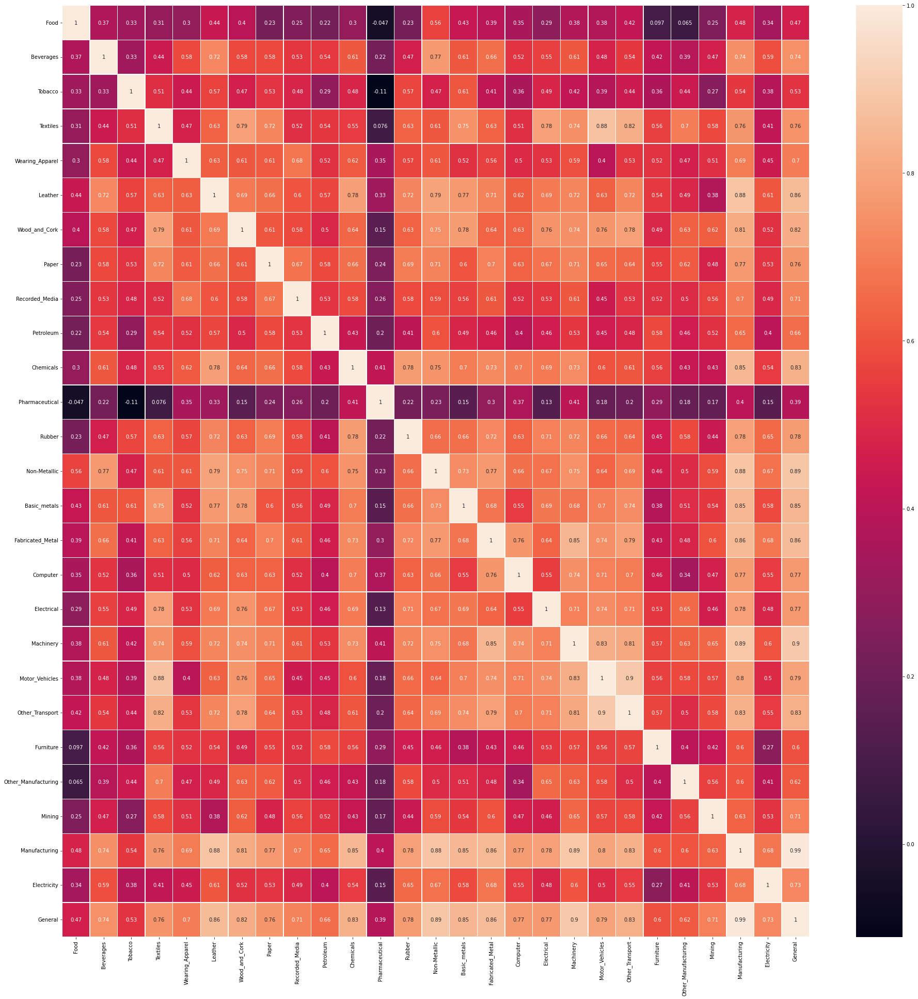

In [ ]:
plt.figure(figsize = (27,27))
ax = sns.heatmap(m_gip.corr().iloc[0:27, 0:27], annot=True, linewidths=.4)
plt.tight_layout()

In [ ]:
def get_redundant_pairs(df):
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

In [ ]:
def get_top_correlations(df, n=5):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

In [ ]:
print("Top Correlations (Excluding Major and General)")
get_top_correlations(m_gip.iloc[:,1:25], 7)

Top Correlations (Excluding Major and General)


Motor_Vehicles    Other_Transport    0.897869
Textiles          Motor_Vehicles     0.880541
Fabricated_Metal  Machinery          0.846226
Machinery         Motor_Vehicles     0.826154
Textiles          Other_Transport    0.824248
Machinery         Other_Transport    0.810871
Leather           Non-Metallic       0.794949
dtype: float64

In [ ]:
print("Top Correlations")
get_top_correlations(m_gip.iloc[:,1:], 10)

Top Correlations


Manufacturing     General            0.993224
Motor_Vehicles    Other_Transport    0.897869
Machinery         General            0.897088
                  Manufacturing      0.894720
Non-Metallic      General            0.887445
Leather           Manufacturing      0.884548
Non-Metallic      Manufacturing      0.884349
Textiles          Motor_Vehicles     0.880541
Fabricated_Metal  General            0.864487
Leather           General            0.858452
dtype: float64

## **Modelling**

Autocorrelation,

In [ ]:
from pandas.plotting import autocorrelation_plot

Transformation for attaining stationarity,

In [ ]:
# ts_diff = np.diff(m_gip['Food'])
# m_gip['Food_1'] = np.append([0], ts_diff)

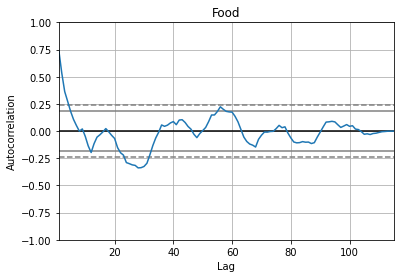

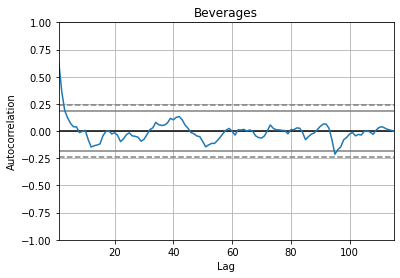

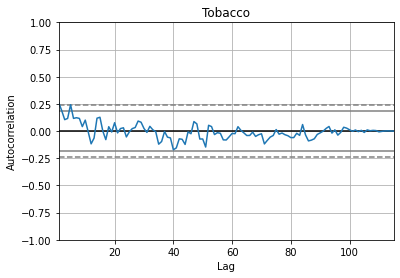

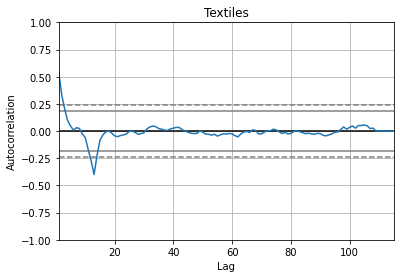

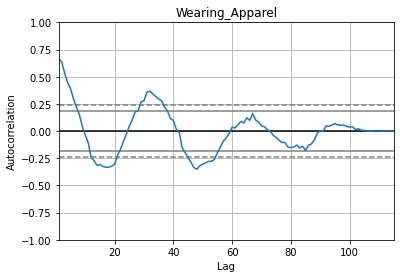

...

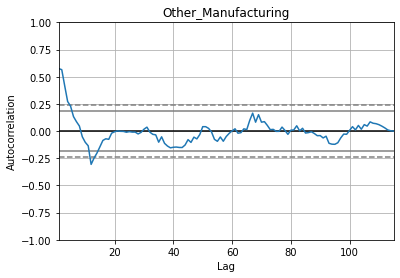

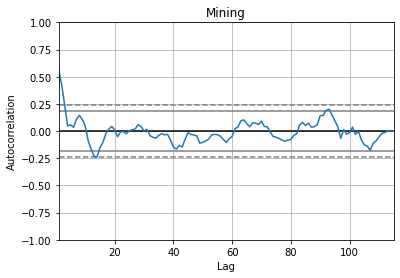

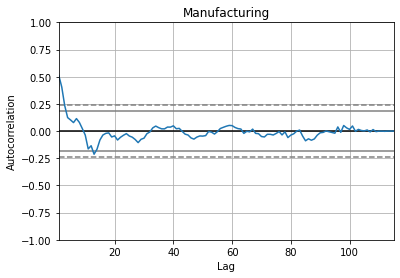

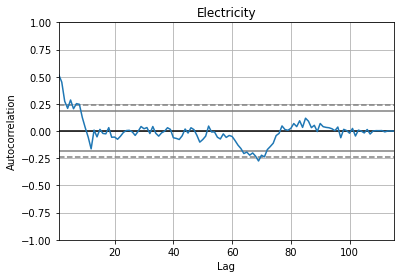

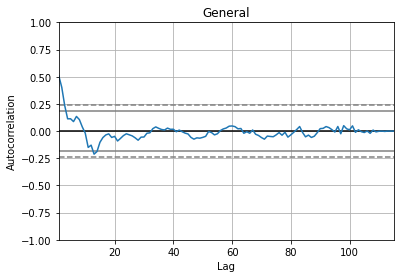

In [ ]:
for column in m_gip.drop('Date', axis=1):
    # m_gip[column] = np.log(abs(m_gip[column]))
    autocorrelation_plot(m_gip[column])
    plt.title('{}'.format(column))
    plt.show()

We try to apply **ARIMA** and **Auto-ARIMA** for **Food**,

In [ ]:
m_gip['Food'] = np.log(abs(m_gip['Food']))

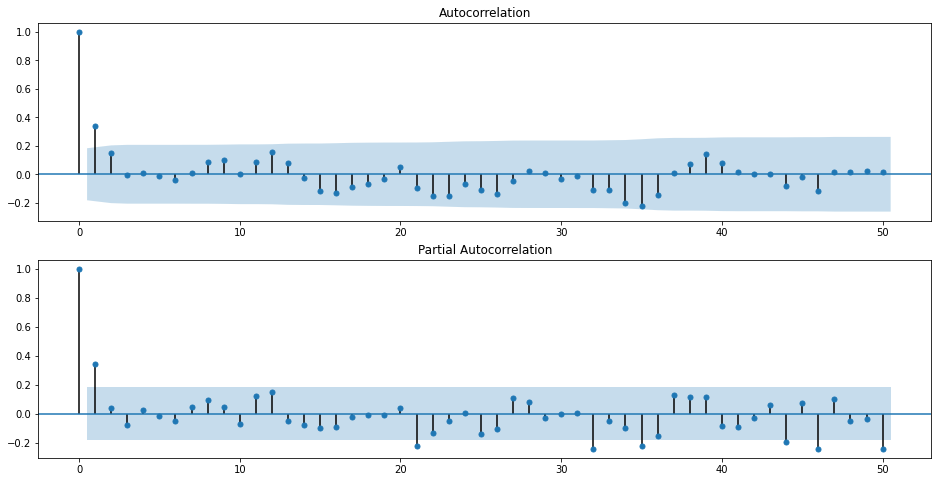

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

f, ax = plt.subplots(nrows=2, ncols=1, figsize=(16, 8))

plot_acf(m_gip['Food'], lags=50, ax=ax[0])
plot_pacf(m_gip['Food'], lags=50, ax=ax[1])

plt.show()

From the diagram above, we can see that,


*   ACF - Big drop after 1st lag
*   PACF - Big drop after 1st lag

So, for ARIMA we go for a (1,0,1) split.

(I = 0 because the data is not stationary even after transformation; will need to see other measures)

In [ ]:
train_size = int(0.85 * len(m_gip))
test_size = len(m_gip) - train_size

In [ ]:
univariate_df = m_gip[['Date', 'Food']].copy()
univariate_df.columns = ['ds', 'y']

In [ ]:
train = univariate_df.iloc[:train_size, :]

In [ ]:
train.shape

(97, 2)

In [ ]:
train.head()

,ds,y
0,2012-04-01,0.993252
1,2012-05-01,2.116256
2,2012-06-01,2.631889
3,2012-07-01,2.476538
4,2012-08-01,2.646175


In [ ]:
x_train, y_train = pd.DataFrame(univariate_df.iloc[:train_size, 0]), pd.DataFrame(univariate_df.iloc[:train_size, 1])
x_valid, y_valid = pd.DataFrame(univariate_df.iloc[train_size:, 0]), pd.DataFrame(univariate_df.iloc[train_size:, 1])

In [ ]:
x_valid.shape

(18, 1)

In [ ]:
x_valid.head()

,ds
97,2020-05-01
98,2020-06-01
99,2020-07-01
100,2020-08-01
101,2020-09-01


In [ ]:
from statsmodels.tsa.arima_model import ARIMA

# Fit model
model = ARIMA(y_train, order=(1,0,0))
model_fit = model.fit()

# Prediction with ARIMA
y_pred, se, conf = model_fit.forecast(18)

# Calcuate metrics
score_mae = mean_absolute_error(y_valid, y_pred)
score_rmse = math.sqrt(mean_squared_error(y_valid, y_pred))
score_mape = mean_absolute_percentage_error(y_valid, y_pred)

print('MAE: {}'.format(score_mae))
print('RMSE: {}'.format(score_rmse))
print('MAPE: {}'.format(score_mape))

MAE: 0.9620403121844971
RMSE: 1.2606317660475215
MAPE: 2.0340233915765773


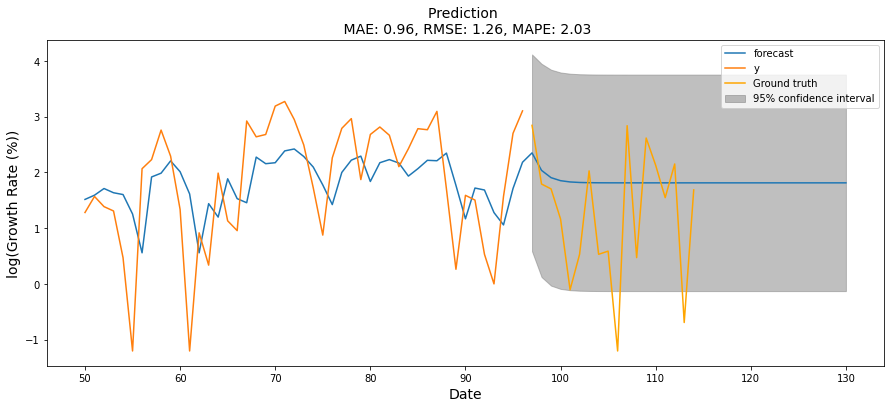

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(6)
f.set_figwidth(15)
ax.autoscale()
model_fit.plot_predict(50, 130, ax=ax)
sns.lineplot(x=x_valid.index, y=y_valid['y'], ax=ax, color='orange', label='Ground truth') 

ax.set_title(f'Prediction \n MAE: {score_mae:.2f}, RMSE: {score_rmse:.2f}, MAPE: {score_mape:.2f}', fontsize=14)
ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='log(Growth Rate (%))', fontsize=14)
# plt.axis([50, 140, 3, 7])
plt.show()

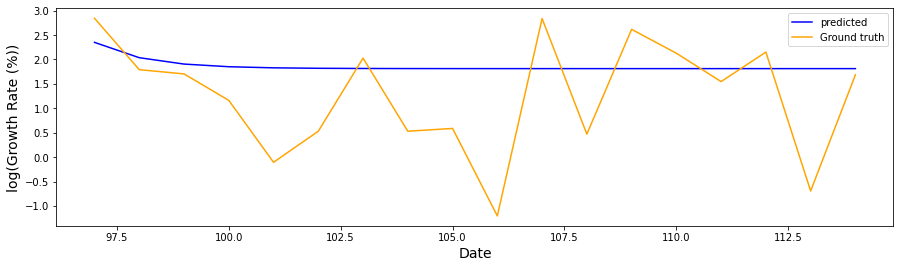

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(4)
f.set_figwidth(15)

sns.lineplot(x=x_valid.index, y=y_pred, ax=ax, color='blue', label='predicted') 
sns.lineplot(x=x_valid.index, y=y_valid['y'], ax=ax, color='orange', label='Ground truth') 

ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='log(Growth Rate (%))', fontsize=14)

plt.show()

Degrading scipy to run pmdarima, displays ImportError otherwise

In [ ]:
# !pip install pmdarima scipy==1.2 -Uqq

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
import pmdarima as pm

arima = pm.auto_arima(y_train, start_p=1, start_q=1,
                      max_p=3, max_q=3, 
                      m=1,              
                      d=0,           
                      seasonal=False,   
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

print(arima.summary())

Fit ARIMA: order=(1, 0, 1); AIC=262.621, BIC=272.920, Fit time=0.063 seconds
Fit ARIMA: order=(0, 0, 0); AIC=277.461, BIC=282.611, Fit time=0.003 seconds
Fit ARIMA: order=(1, 0, 0); AIC=261.283, BIC=269.007, Fit time=0.027 seconds
Fit ARIMA: order=(0, 0, 1); AIC=262.200, BIC=269.924, Fit time=0.023 seconds
Fit ARIMA: order=(2, 0, 0); AIC=262.517, BIC=272.816, Fit time=0.035 seconds
Fit ARIMA: order=(2, 0, 1); AIC=264.500, BIC=277.374, Fit time=0.169 seconds
Total fit time: 0.329 seconds
                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                   97
Model:                     ARMA(1, 0)   Log Likelihood                -127.642
Method:                       css-mle   S.D. of innovations              0.901
Date:                Fri, 21 Jan 2022   AIC                            261.283
Time:                        13:15:53   BIC                            269.007
Sample:                           

Auto-ARIMA suggests that (1,0,0) is the best split and not (1,0,1). <br>
Plotting it,

In [ ]:
model = ARIMA(y_train, order=(1,0,0))
model_fit = model.fit()

y_pred, se, conf = model_fit.forecast(18)

score_mae = mean_absolute_error(y_valid, y_pred)
score_rmse = math.sqrt(mean_squared_error(y_valid, y_pred))
score_mape = mean_absolute_percentage_error(y_valid, y_pred)

print('MAE: {}'.format(score_mae))
print('RMSE: {}'.format(score_rmse))
print('MAPE: {}'.format(score_mape))

MAE: 0.9620403121844971
RMSE: 1.2606317660475215
MAPE: 2.0340233915765773


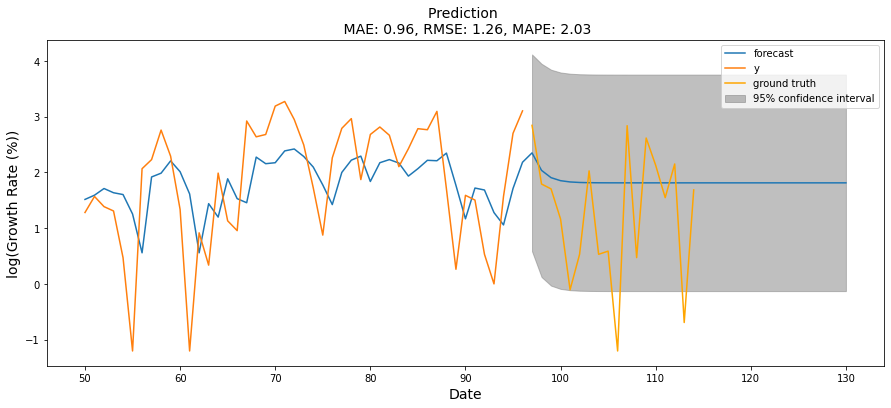

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(6)
f.set_figwidth(15)
ax.autoscale()
model_fit.plot_predict(50, 130, ax=ax)
sns.lineplot(x=x_valid.index, y=y_valid['y'], ax=ax, color='orange', label='ground truth') 

ax.set_title(f'Prediction \n MAE: {score_mae:.2f}, RMSE: {score_rmse:.2f}, MAPE: {score_mape:.2f}', fontsize=14)
ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='log(Growth Rate (%))', fontsize=14)
# plt.axis([50, 140, 3, 7])
plt.show()

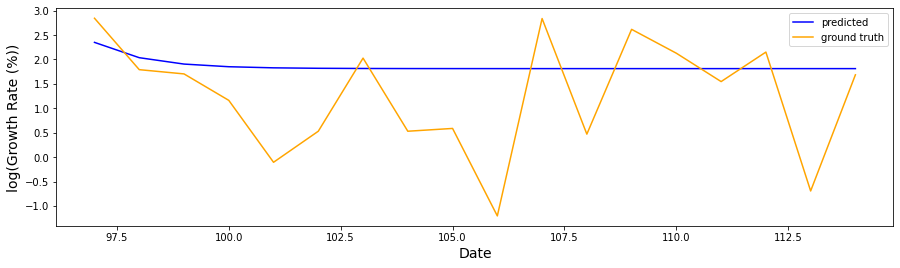

In [ ]:
f, ax = plt.subplots(1)
f.set_figheight(4)
f.set_figwidth(15)

sns.lineplot(x=x_valid.index, y=y_pred, ax=ax, color='blue', label='predicted') 
sns.lineplot(x=x_valid.index, y=y_valid['y'], ax=ax, color='orange', label='ground truth') 

ax.set_xlabel(xlabel='Date', fontsize=14)
ax.set_ylabel(ylabel='log(Growth Rate (%))', fontsize=14)

plt.show()

# **Inferences**

In [ ]:
# dm_iip.iloc[24:,:].columns

<Figure size 432x288 with 0 Axes>

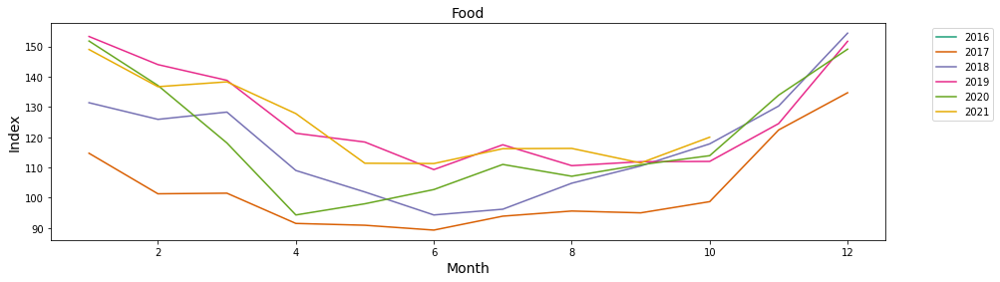

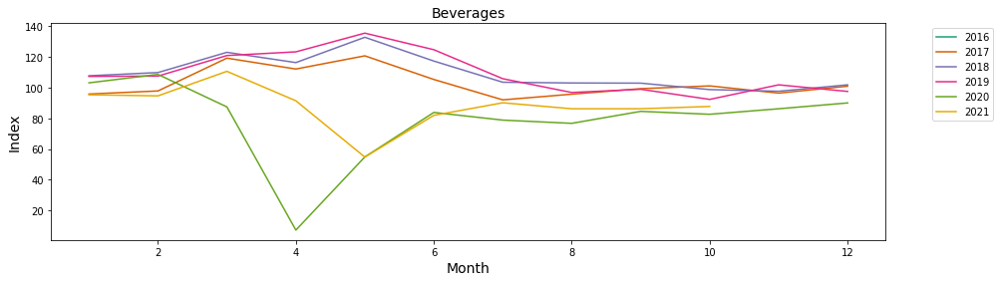

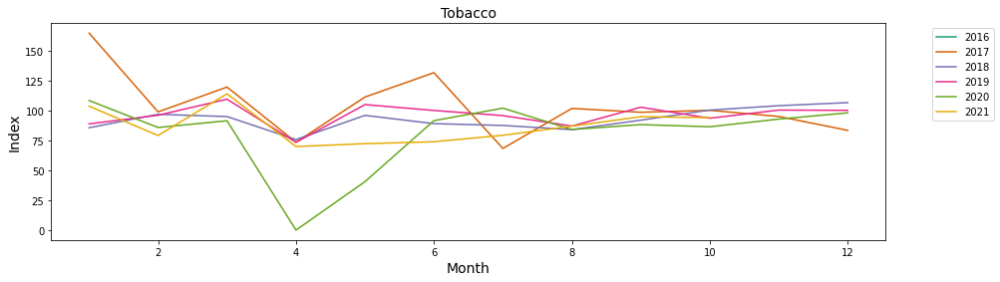

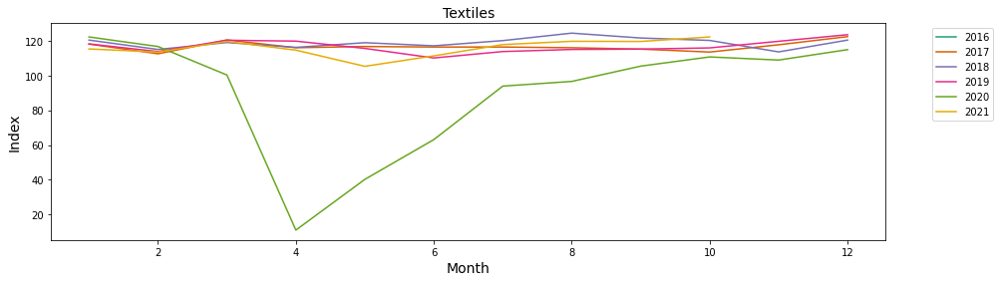

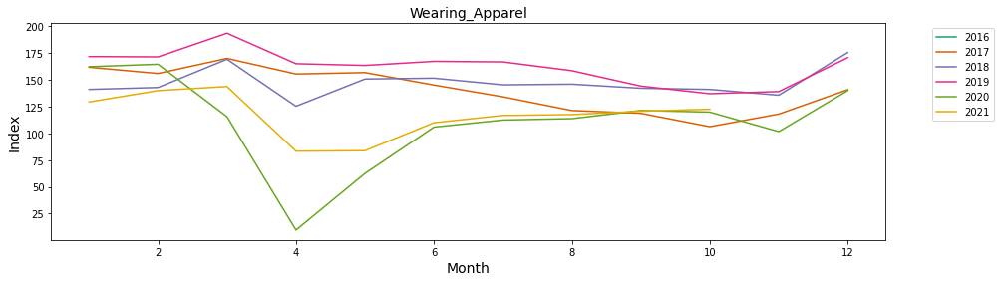

...

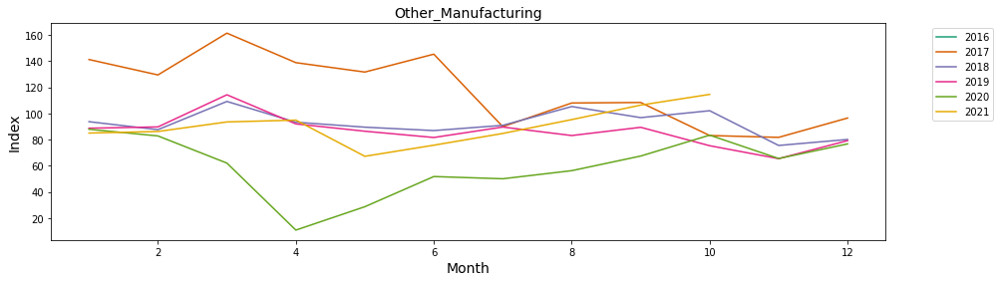

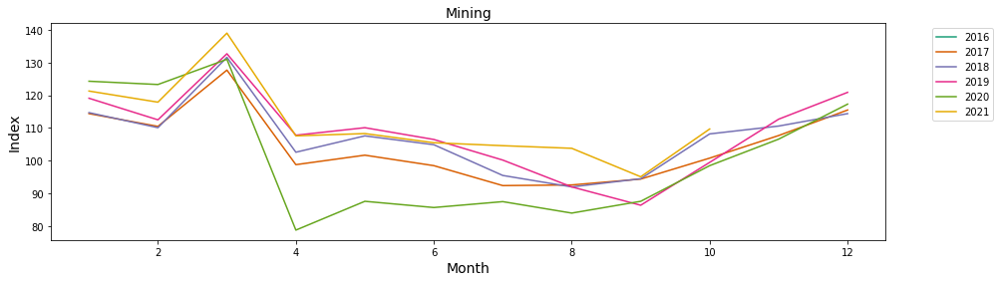

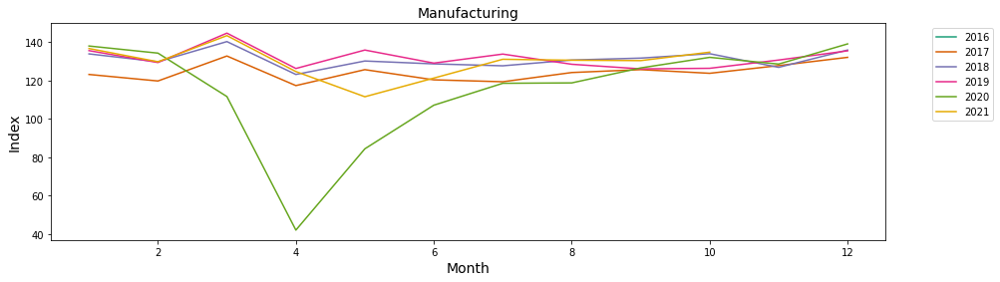

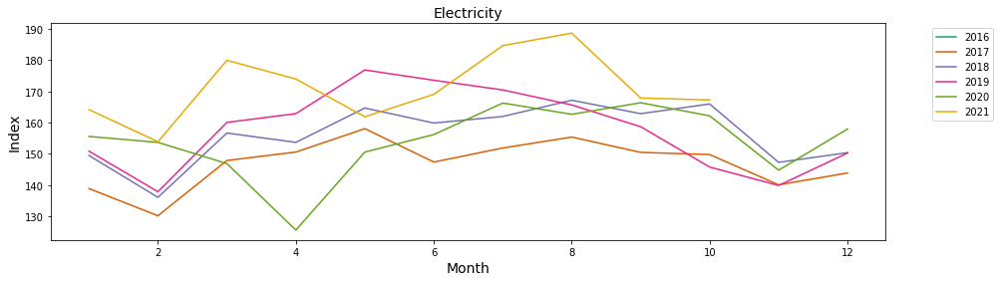

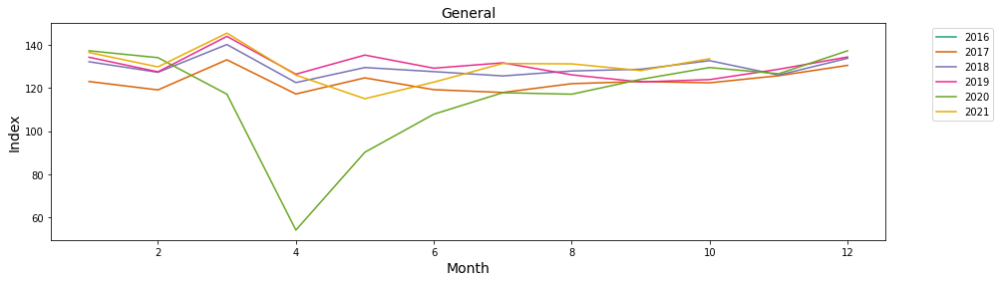

In [ ]:
# plt.subplots_adjust(hspace = 0.35)
from matplotlib.pyplot import figure
plt.subplots_adjust(hspace = 0.35)

for column in dm_gip.iloc[:,:27].columns:
    f, ax = plt.subplots(1)
    f.set_figheight(4)
    f.set_figwidth(15)
    print()
    sns.lineplot(data=dm_iip.iloc[56:,], x='Month', y=column, hue='Year', legend='full', palette='Dark2')
    plt.title('{}'.format(column),fontsize=14)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
    plt.ylabel(ylabel='Index', fontsize=14)
    plt.xlabel(xlabel='Month', fontsize=14)
    plt.show()